In [1515]:
import pandas as pd
import numpy as np
import wfdb
import math

import matplotlib.pyplot as plt
from matplotlib import gridspec
%matplotlib inline
%config InlineBackend.figure_format='retina'
from matplotlib import gridspec
import seaborn as sns

import scipy as sp
from scipy import signal
from scipy import fftpack
from scipy.signal import find_peaks
from scipy.signal import argrelmax
from scipy.ndimage import gaussian_filter1d

import statistics
from statistics import median
from statistics import mean

import glob
import os
import ntpath

from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 1000em; }</style>"))

In [1516]:
def files_read_csv(path):
    
    pd_csv_dict = {}
    csv_files = glob.glob(os.path.join(path, "*.csv"))
    for csv_file in csv_files:
        file_name = ntpath.basename(csv_file)
        pd_csv_dict['pd_' + file_name] = pd.read_csv(csv_file, sep=",", encoding='mac_roman')
    locals().update(pd_csv_dict)
    
    return pd_csv_dict

def analyze_wave_breath_hold (file):
    
    data = remove_edge_noise(files_breath_hold[file]['gFz'] + 1.1)
    HR, RR, peaks_out, outliers, dataset = peak_id(data, 100, 1.7, .98, 4, 4)
    data_2nd_dev_smoothed = wave_calculus(dataset.gFz, peaks_out)
    split_beats(dataset, peaks_out, RR, HR)

def analyze_wave_breathing (file):
    
    data = remove_edge_noise(files_breathing[file]['gFz'] + 1.1)
    HR, RR, peaks_out, outliers, dataset = peak_id(data, 100, 1.7, .98, 4, 4)
    data_2nd_dev_smoothed = wave_calculus(dataset.gFz, peaks_out)
    split_beats(dataset, peaks_out, RR, HR)

def remove_edge_noise (data):

    # Remove Edge Noise
    plt.figure(figsize=(12,2))
    plt.plot(data, color='red')    

    data_len = len(data)-1
    
    data_cutoff_l = 0
    data_cutoff_r = data_len
    
    for i in range(0,int((data_len)/2)):

        if abs(data[i]) >= median(abs(data))*1.5:
            data_cutoff_l = i+100
        
        if abs(data[data_len-i]) >= median(abs(data))*1.5:
            data_cutoff_r = data_len-i-100
        
    data = data[data_cutoff_l:data_cutoff_r]
    
    plt.plot(data, color = 'steelblue')
    plt.show()

    offset = data.index[0]
    data.index = data.index - offset
    
    return data
    
def peak_id (data, maxHR, amplify, noise, lpr, rpr):

    minDist = 6000/maxHR

    # Set Min Threshold
    height = pd.DataFrame(data)
    col = height.reset_index().columns[1]
    height = height[height[col] < height[col].quantile(noise)]
    height = height[height[col] > height[col].quantile(noise-0.035)]
    ht = median(height[col])

    all_peaks, _ = find_peaks(data, height=ht, distance=minDist)

    # Remove Noise
    outlier_threshold = amplify*(median(data[all_peaks])-median(data))+median(data)
    all_peaks = pd.DataFrame(data[all_peaks])

    outliers = all_peaks[all_peaks[data.name] >= outlier_threshold]
    true_peaks = all_peaks[all_peaks[data.name] < outlier_threshold]

    # Remove Outliers
    left_exclude = min(lpr,1)*all_peaks.index[int(max(lpr-1,0))]+int(minDist)
    right_exclude = all_peaks.index[-int(max(1,rpr))]-min(rpr,1)*int(minDist)
    clean_range = data[left_exclude:right_exclude]

    all_peaks.reset_index(inplace=True)
    cleaned_peaks = all_peaks[all_peaks['index'].between(left_exclude,right_exclude)]
    removed_peaks = pd.merge(all_peaks, cleaned_peaks, how='outer', indicator=True)
    removed_peaks = removed_peaks[removed_peaks._merge == 'left_only'].drop('_merge', axis=1)

    outliers.reset_index(inplace=True)
    outliers = outliers.set_index('index')
    removed_peaks = removed_peaks.set_index('index')
    
    peaks = cleaned_peaks.set_index('index')
    dataset = pd.DataFrame(clean_range)

    # Find RR Interval
    RR = np.diff(peaks.index)
    HR = 6000/mean(RR)
    
    plt.figure(figsize=(12,2))
    plt.plot(data)
    plt.plot(peaks, "x",color='green')
    plt.plot(removed_peaks,'o',color='orange')
    plt.plot(outliers,'o',color='red')
    plt.show()
    
    offset = dataset.index[0]
    dataset.index = dataset.index - offset
    peaks.index = peaks.index - offset
    
    return HR, RR, peaks, outliers, dataset

def salient_points (data):
    
    ht = median(data)*1.01
    systolic_window = mean(RR)*.25
    
    all_peaks, _ = find_peaks(data, height=ht, distance=5)
    all_peaks = pd.DataFrame(data[all_peaks])
    
    systolic_peaks = pd.DataFrame(columns = ['index', 'gFz'])
    all_peaks.reset_index(inplace=True)

    for i in peaks.index:
        systolic_peaks = pd.concat([systolic_peaks,all_peaks[all_peaks['index'].between(max(i-systolic_window,0),i+systolic_window)]]).drop_duplicates().reset_index(drop=True)

    systolic_peaks = systolic_peaks.set_index('index')

def wave_calculus (data_z, peaks):  
  
    data_1st_dev = np.gradient(data_z)
    data_2nd_dev = np.gradient(data_1st_dev)
    data_2nd_dev_smoothed = np.clip(np.abs(np.gradient(data_2nd_dev)), 0.0001, 2)

    end = len(data_2nd_dev_smoothed+1)
    area_sum = pd.DataFrame(columns=['Area'])

    for i in range(100):

        y_plot = data_2nd_dev_smoothed[0:end-1]
        b, a = signal.butter(2, (1005-i)/1010, btype='lowpass', analog=False)
        y_plot = signal.filtfilt(b, a, y_plot)

        x_plot = list(range(1, end))

        dx = (x_plot[end-2]-x_plot[0])/len(x_plot[0:end-2])
        area = np.trapz(y_plot[0:end-1], dx = dx)
        area_sum.loc[len(area_sum.index)] = area

        if i == 90:
            graph = [x_plot, y_plot]
    
    avg_auc = mean(area_sum.Area[0:90])
    
    return data_2nd_dev_smoothed, avg_auc, graph

def split_beats(data, peaks, RR, HR):
    
    print('\n')
    s = '\033[01m'+'          Waveform Summary          '
    x = '{:.^116}'.format(s)
    print(x)
    print('\n')
    
    colors = ['lightsteelblue','steelblue']
    
    avg_auc = list(range(1, len(peaks)-1))
    duration = list(range(1, len(peaks)-1))

    # define subplot grid
    nc = 3
    nr = math.ceil((len(peaks.index)-1) / nc )+1
    fig, axs = plt.subplots(nrows=nr, ncols=nc, figsize = (nc*5,nr*4))
    fig.suptitle("Individual Beats\n\n\n", fontsize = 26)
    fig.tight_layout(h_pad=15, w_pad=12)

    for i in range(1,len(peaks.index)-1):
        
        start = int(peaks.index[i]-RR[i-1]*.3)
        end = int(peaks.index[i]+RR[i]*.7)
        
        duration[i-1] = end-start

        beat_data = data.gFz[start:end]
        beat_peaks = peaks[start:end]
        
        offset = beat_data.index[0]
        beat_data.index = beat_data.index - offset
        beat_peaks.index = beat_peaks.index - offset
        
        data_out, avg_auc[i-1], graph_data = wave_calculus(beat_data, beat_peaks)

        # add a new subplot iteratively using nrows and cols
        ax = plt.subplot(nr, nc, i)
        ax.plot(beat_data, color = colors[i%2])
        ax.plot(data_out+1.1*max(data_out), color = colors[1])
        ax.fill_between(graph_data[0], graph_data[1], color='steelblue', zorder=10)
        ax.grid(True, color = 'lightgray')

        # chart formatting
        ax.set_title("Beat: " + str(i),fontsize = 18)
        ax.set_xlabel("Time (ms)\n\nBeat: "+str(i)+"\nBeat Duration: " + str(duration[i-1]) + " ms" + "\nPeak Height: " + str(peaks.gFz[peaks.index[i]]) + "\n" + "AUC: " + str(avg_auc[i-1]),fontsize = 14)

    for ax in axs.flat[len(peaks.index)-2:]:
        ax.remove()
        
    plt.show()

    sns.kdeplot(avg_auc)
    sns.rugplot(avg_auc)

    plt.show()
    
    plt.plot(avg_auc)

    print("\nHeart Rate: " + str(HR))
    print("Number of Beats: " + str(len(peaks)-2))
    print("\nBaseline Height: " + str(median(data.gFz)))
    print("\nMean Beat Duration: " + str(mean(duration)) + " ms")
    print("Minimum Beat Duration: " + str(min(duration)) + " ms")
    print("Maximum Beat Duration: " + str(max(duration)) + " ms")
    print("Beat Duration Variance: " + str(statistics.variance(duration)) + " ms")
    print("\nMean Peak Height: " + str(mean(peaks.gFz[peaks.index[1:len(peaks)-1]])))
    print("Minimum Peak Height: " + str(min(peaks.gFz[peaks.index[1:len(peaks)-1]])))
    print("Maximum Peak Height: " + str(max(peaks.gFz[peaks.index[1:len(peaks)-1]])))
    print("Peak Height Variance: " + str(statistics.variance(peaks.gFz[peaks.index[1:len(peaks)-1]])))
    print("\nMean Beat AUC: " + str(mean(avg_auc)))
    print("Minimum Beat AUC: " + str(min(avg_auc)))
    print("Maximum Beat AUC: " + str(max(avg_auc)))
    print("Beat AUC Variance: " + str(statistics.variance(avg_auc)) + "\n\n")

###########################     ==============================================     ############################
                                                 File: PM9_b                                                 
###########################     ==============================================     ############################


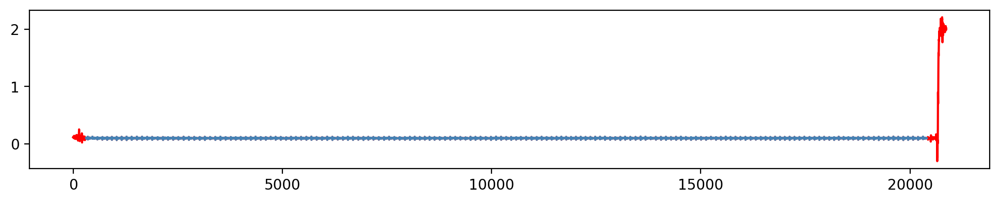

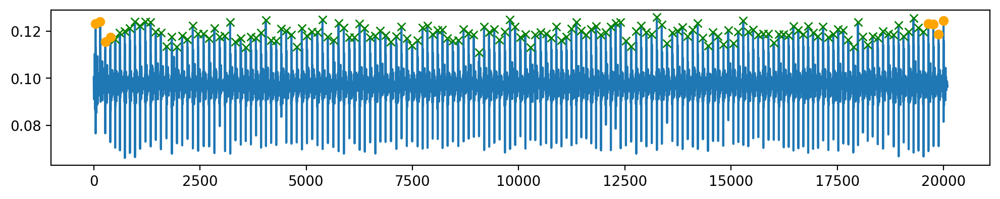



.....................................          Waveform Summary          ......................................




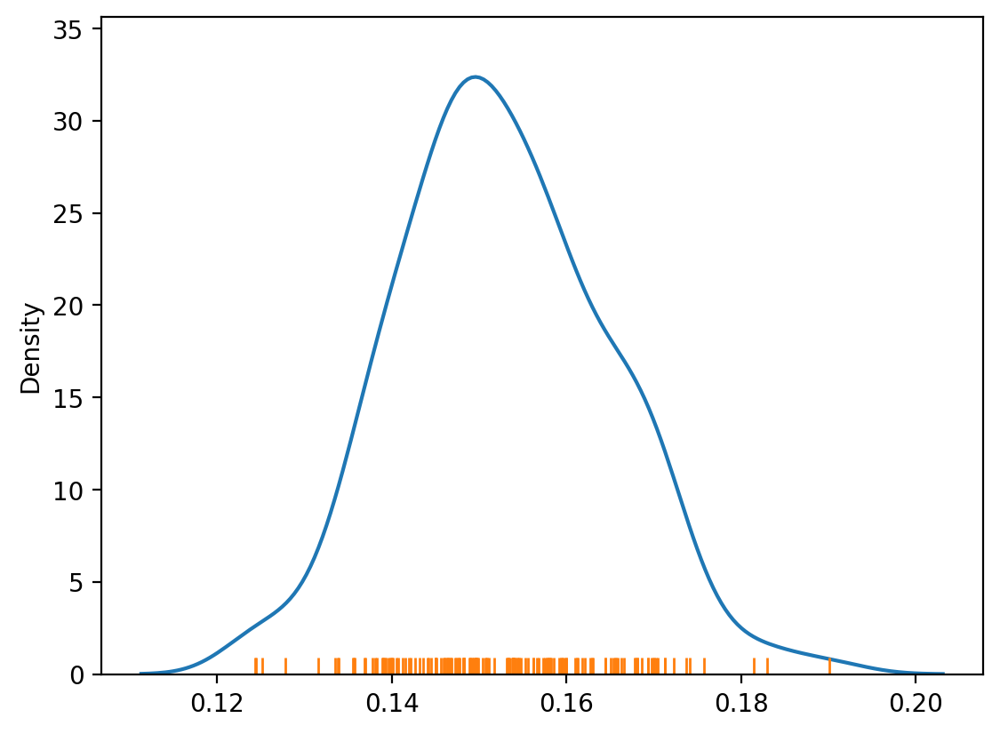


Heart Rate: 50.0
Number of Beats: 157

Baseline Height: 0.09732971191406259

Mean Beat Duration: 120.45859872611464 ms
Minimum Beat Duration: 111 ms
Maximum Beat Duration: 131 ms
Beat Duration Variance: 15.339621100767598 ms

Mean Peak Height: 0.11911867955687708
Minimum Peak Height: 0.11095581054687509
Maximum Peak Height: 0.12601623535156248
Peak Height Variance: 8.45199082306538e-06

Mean Beat AUC: 0.15259736450260378
Minimum Beat AUC: 0.12436570224015432
Maximum Beat AUC: 0.19008331486194757
Beat AUC Variance: 0.00014299165583214917




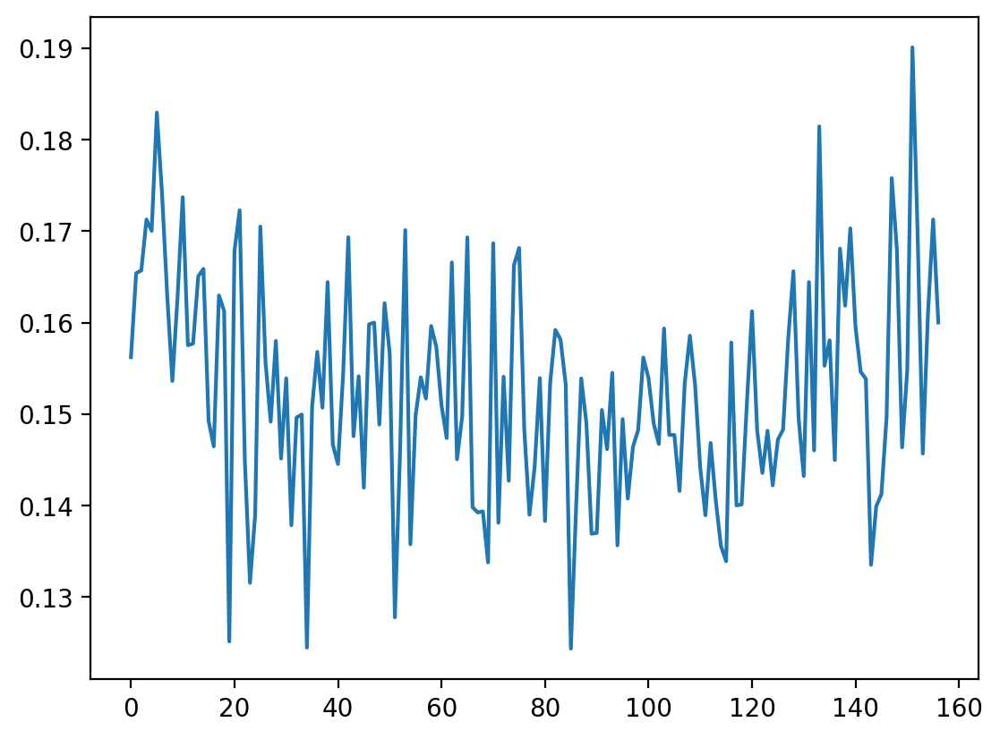

In [1517]:
# Import Files
files_breath_hold = files_read_csv('Breath_Hold/')
files_breathing = files_read_csv('Breathing/')

#for file in files_breath_hold:
#    print("=================================================\n\nFile: "+str(file[3:-4])+"\n\n=================================================")
#    analyze_wave_breath_hold(str(file))

for file in files_breathing:

    S = '\033[01m'+'     ==============================================     '
    s2= '                                '+'\033[43m'+'\033[30m'+'\033[01m'+'File: ' + str(file[3:-4]) + '\033[0;0m'+'                                '
    x = '{:#^116}'.format(S)
    x2 = '{:^130}'.format(s2)
    print(x)
    print(x2)
    print(x)
    
    analyze_wave_breathing(str(file))